## Part 3 - forest fires? 

┌ Info: Saved animation to /home/sacredeux/Documents/Chalmers/FFR120/HW1/part3/forest_fires_N=64.gif
└ @ Plots /home/sacredeux/.julia/packages/Plots/8ZnR3/src/animation.jl:156


Plots.AnimatedGif("/home/sacredeux/Documents/Chalmers/FFR120/HW1/part3/forest_fires_N=64.gif")
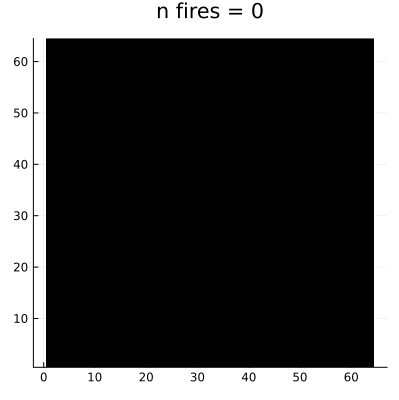

In [ ]:
using Random
using LinearAlgebra
using Plots
# Let us try in Julia instead:

"""
This function simulates forest fires given parameters\n
    N - the side length of the 2D grid (i.e. the size of the grid is N²) 
    p - the probability of a sprouting 
    f - the probability lightning strikes in a randomly selected cell
    t_end - the number of time steps to take, because the time step size is 1. \n
    Returns:
    - The number of forest fires
    - The size of the fires as an array
"""


function periodic_boundaries(coords, N)
        
        i,j = Tuple(coords)

        i > N ? 1 : i < 1 ? N : i
        j > N ? 1 : j < 1 ? N : j
        
    return CartesianIndex(i, j)
end


function forest_fires(N, p, f, t_end)

    S = zeros(Int, N, N) # Status array, 0: No trees, 1: Trees 2: Burned  3: Expanding fire  
    fire_sizes = zeros(Int, t_end)
    fire_count = 0

    grid_indices = CartesianIndices(S)
    offsets = [CartesianIndex(i, j) for i in -1:1 for j in -1:1 if !(i == 0 && j == 0)]

    anim = Animation()
    colors = [:black, :green, :red]
    plt = heatmap(S, aspect_ratio=1, title="n fires = $fire_count", size=(400,400), color = colors, colorbar=false, clim=(0, 2))
    frame(anim, plt)
    
    for t in 1:t_end
        # Sprout new trees:
        S[rand(N, N) .< p .&& S .== 0] .= 1
        
        # Destroy trees depending on lightning:
        lightning_location = rand(grid_indices)
        if rand() < f && S[lightning_location] == 1
            S[lightning_location] = 3
            fire_count += 1

            while sum(S .== 3) > 0
                for burning_location in findall(==(3), S)
                    # i,j = Tuple(burning_location)
                    for offset in offsets
                        neighbor = periodic_boundaries(burning_location + offset, N)
                        if S[neighbor] == 1
                            S[neighbor] = 3
                        end
                    end
                    S[burning_location] = 2
                end # for burning
            end # while
        end # if lightning

        plt = heatmap(S, aspect_ratio=1, title="n fires = $fire_count", size=(400,400), color = colors, colorbar=false, clim=(0, 2))
        frame(anim, plt)
        @assert sum(S .== 3) == 0
        fire_sizes[t] = sum(S .== 2)
        fire_locations = findall(==(2), S)
        S[fire_locations] .= 0
        
    end # t_end
    gif(anim, "forest_fires_N=$N.gif", fps=10)


end # function


forest_fires(64, 0.01, 0.2, 10_000)

In [ ]:
using BenchmarkTools
function modulo_boundary(N)
    s = 0
    for i in 1:N
        s+=mod1(i, 9000)
    end
    return s
end

function periodic_boundaries(coords, N)
        
        i,j = Tuple(coords)

        i > N ? 1 : i < 1 ? N : i
        j > N ? 1 : j < 1 ? N : j
        
    return CartesianIndex(i, j)
end

@btime modulo_boundary(10_000)
# @btime periodic_boundaries(10_000)

  28.721 μs (0 allocations: 0 bytes)
  11.363 ns (0 allocations: 0 bytes)


50005000